# Learned $\tau$ inspection

1. Run the **imports / helpers** cell, then set **`ROOT_DIR`**, **`ABLATIONS`**, and **`CONFIG_DIRS`** in the **paths** cell (one folder per model variant; each contains `run_*`).

- **Layout A (ablation roots):** `CONFIG_DIRS` = `{ROOT_DIR}/{full,nowg,…}` so `config_label` is just the ablation name (or any single path segment). One combined figure: all variants × annotations.
- **Layout B (τ-prior subfolders):** `CONFIG_DIRS` = `{ROOT_DIR}/{abl}/{tau2_norm_prior,…}`. The notebook detects this and still produces **one figure per τ-prior**.

Each run should have `tau_T.csv` (final values) and `tau_history.csv` (per-epoch traces).

- **Summary bars:** **mean** final $\tau_1$ / $\tau_2$ over runs — grouped bars (x = ablation, clustered by annotation, legend = annotation). Easier to read than the old side-by-side box summary.
- **Per-config box plots:** distribution of final $\tau$ per annotation across runs (one figure per `config_root`).
- **Trajectories:** $\tau_1$ and $\tau_2$ vs **epoch**; faint lines per run + **mean across runs** per annotation.


In [1]:
from __future__ import annotations

import os
import re

import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Paths: set ROOT_DIR, ABLATIONS, CONFIG_DIRS in the next cell before loading data.

ABLATIONS = ["full", "nowg", "norhog", "nowg_norhog"]
TAU_PRIOR_SUBDIRS = [
    "tau1_norm_prior",
    "tau2_norm_prior",
    "tau12_norm_prior",
    "tau12_dir_prior",
]
PRIORS = list(TAU_PRIOR_SUBDIRS)

REPO_SRC = "/gpfs/commons/home/vmazeeva/firvTWAS/parmigiano-expr/src"

# Populated in the paths cell (needed by _short_config_label when loading).
ROOT_DIR = ""  # set in the paths cell (next)


def _short_config_label(root: str) -> str:
    """Short label: path under ROOT_DIR; else basename chain."""
    r = os.path.abspath(root)
    if ROOT_DIR:
        pfx = os.path.abspath(ROOT_DIR)
        if r.startswith(pfx + os.sep):
            return r[len(pfx) + 1 :]
    return r


def list_run_dirs(config_root: str) -> list[str]:
    if not os.path.isdir(config_root):
        return []
    pat = re.compile(r"^run_(\d+)$")
    entries = []
    for name in os.listdir(config_root):
        m = pat.match(name)
        if m and os.path.isdir(os.path.join(config_root, name)):
            entries.append((int(m.group(1)), os.path.join(config_root, name)))
    return [p for _, p in sorted(entries)]


def load_final_tau_long(config_root: str) -> pd.DataFrame:
    """One row per (run, annotation) with final Tau1, Tau2 from tau_T.csv."""
    rows = []
    label = _short_config_label(config_root)
    for run_path in list_run_dirs(config_root):
        fp = os.path.join(run_path, "tau_T.csv")
        if not os.path.isfile(fp):
            continue
        try:
            df = pd.read_csv(fp)
        except Exception:
            continue
        need = {"Annotation", "Tau1", "Tau2"}
        if not need.issubset(df.columns):
            continue
        run_id = os.path.basename(run_path)
        for _, r in df.iterrows():
            rows.append(
                {
                    "config_root": config_root,
                    "config_label": label,
                    "run": run_id,
                    "annotation": str(r["Annotation"]),
                    "tau1": float(r["Tau1"]),
                    "tau2": float(r["Tau2"]),
                }
            )
    return pd.DataFrame(rows)


def load_tau_history(run_path: str) -> pd.DataFrame | None:
    fp = os.path.join(run_path, "tau_history.csv")
    if not os.path.isfile(fp):
        return None
    try:
        return pd.read_csv(fp)
    except Exception:
        return None


def history_tau_columns(hist: pd.DataFrame, prefix: str) -> list[str]:
    """Columns like Tau1_chrombpnet given prefix 'Tau1_'."""
    return sorted(c for c in hist.columns if c.startswith(prefix))


def tau_prior_plot_title(prior_subdir: str) -> str:
    """Two-line figure title for a given results subdirectory."""
    known = {
        "tau1_norm_prior": r"Final $\tau$ — $\tau_1$ normal prior, $\tau_2$ Dirichlet",
        "tau2_norm_prior": r"Final $\tau$ — $\tau_1$ Dirichlet, $\tau_2$ normal prior",
        "tau12_norm_prior": r"Final $\tau$ — $\tau_1$ and $\tau_2$ normal priors",
        "tau12_dir_prior": r"Final $\tau$ — $\tau_1$ and $\tau_2$ Dirichlet",
    }
    line1 = known.get(prior_subdir, rf"Final $\tau$ — {prior_subdir}")
    return line1 + "\n(model variant × annotation)"


def slice_final_tau_by_prior(all_tau: pd.DataFrame, prior_subdir: str) -> pd.DataFrame:
    """Rows under ``{abl}/{prior_subdir}`` for ``abl`` in :data:`ABLATIONS` (excludes e.g. ``beta_maf_1``)."""
    abl = "|".join(re.escape(a) for a in ABLATIONS)
    pat = re.compile(rf"^({abl})/{re.escape(prior_subdir)}$")
    sub = all_tau[all_tau["config_label"].str.match(pat)].copy()
    sub["model_variant"] = sub["config_label"].str.split("/").str[0]
    return sub


def tau_experiment_layout(final_df: pd.DataFrame) -> str:
    """
    ``prior_subdirs`` if any ``config_label`` looks like ``{abl}/<known τ-prior name>``.
    Otherwise ``ablation_roots`` (e.g. ``full``, ``nowg``, or ``full/noT`` only).
    """
    if final_df.empty:
        return "ablation_roots"
    labels = final_df["config_label"].dropna().astype(str).unique()
    prior_names = set(TAU_PRIOR_SUBDIRS)
    for lab in labels:
        parts = lab.split("/")
        if len(parts) >= 2 and parts[1] in prior_names:
            return "prior_subdirs"
    return "ablation_roots"


def add_model_variant_column(df: pd.DataFrame) -> pd.DataFrame:
    """Set ``model_variant`` to full ``config_label`` (ablation-root layout)."""
    out = df.copy()
    out["model_variant"] = out["config_label"].astype(str)
    return out


def load_final_tau_tau2_norm_prior_by_model(
    root_dir: str,
    ablations: list[str] | None = None,
) -> pd.DataFrame:
    """Final τ from each run, restricted to ``{abl}/tau2_norm_prior`` under ``root_dir``."""
    if ablations is None:
        ablations = list(ABLATIONS)
    frames: list[pd.DataFrame] = []
    for abl in ablations:
        cfg = os.path.join(root_dir, abl, "tau2_norm_prior")
        if not os.path.isdir(cfg):
            continue
        d = load_final_tau_long(cfg)
        if d.empty:
            continue
        d = d.copy()
        d["model_variant"] = abl
        frames.append(d)
    if not frames:
        return pd.DataFrame()
    return pd.concat(frames, ignore_index=True)


def plot_tau_by_model_variant_boxplots(
    df: pd.DataFrame,
    *,
    prior_subdir: str | None = None,
    annotations: tuple[str, ...] | None = None,
    figsize: tuple[float, float] | None = None,
    ablation_order: list[str] | None = None,
):
    """τ₁ / τ₂ panels; x = model variant; paired boxes = annotations (colors). Set ``prior_subdir`` for the title."""
    if df.empty:
        print("No rows; check prior slice and run folders.")
        return
    present_mv = set(df["model_variant"])
    if ablation_order is not None:
        order = [m for m in ablation_order if m in present_mv]
    else:
        order = [m for m in ABLATIONS if m in present_mv] + sorted(
            present_mv - set(ABLATIONS)
        )
    if not order:
        print("No matching model_variant in dataframe.")
        return
    if annotations is None:
        ann_list = sorted(df["annotation"].unique())
    else:
        ann_list = list(annotations)
    for ann in ann_list:
        if ann not in df["annotation"].values:
            print(f"Warning: no rows for annotation {ann!r}.")

    n_groups = len(order)
    n_ann = len(ann_list)
    box_w = max(0.22, min(0.36, 2.8 / max(n_ann, 1)))
    inner_stride = box_w + 0.11
    group_step = max(1.85, n_ann * inner_stride + 0.35)
    ann_colors = {a: plt.cm.Set1(i / max(len(ann_list), 1)) for i, a in enumerate(ann_list)}
    centers = [g * group_step + inner_stride * (n_ann - 1) / 2 for g in range(n_groups)]

    if figsize is None:
        fw = min(22.0, 7.0 + 0.55 * n_ann)
        figsize = (fw, 4.2)

    fig, axes = plt.subplots(1, 2, figsize=figsize)
    if prior_subdir is not None:
        st = tau_prior_plot_title(prior_subdir)
    else:
        st = r"Final $\tau$" + "\n(model variant × annotation)"
    fig.suptitle(st, fontsize=11, y=1.0)

    for ax, col, ylab in zip(
        axes,
        ("tau1", "tau2"),
        (r"Final $\tau_1$", r"Final $\tau_2$"),
    ):
        positions: list[float] = []
        data: list[np.ndarray] = []
        for g, m in enumerate(order):
            base = g * group_step
            for aidx, ann in enumerate(ann_list):
                positions.append(base + aidx * inner_stride)
                vals = df.loc[
                    (df["model_variant"] == m) & (df["annotation"] == ann), col
                ].values
                data.append(vals)
        _bp_kw: dict = {
            "positions": positions,
            "widths": box_w,
            "patch_artist": True,
        }
        try:
            bp = ax.boxplot(data, **_bp_kw)
        except TypeError:
            bp = ax.boxplot(data, positions=positions, widths=box_w, patch_artist=True)
        for idx, patch in enumerate(bp["boxes"]):
            ann = ann_list[idx % n_ann]
            patch.set_facecolor(ann_colors[ann])
            patch.set_alpha(0.85)
        ax.set_ylabel(ylab)
        ax.set_xlabel("model variant")
        ax.set_xticks(centers)
        ax.set_xticklabels(order, rotation=15, ha="right")
        ax.grid(axis="y", alpha=0.35)
        ax.set_xlim(centers[0] - 0.65, centers[-1] + 0.65)

    handles = [
        mpatches.Patch(facecolor=ann_colors[a], edgecolor="0.3", label=a, alpha=0.85)
        for a in ann_list
    ]
    ncol = max(1, min(len(ann_list), 6))
    fig.legend(
        handles=handles,
        title="annotation",
        ncol=ncol,
        loc="upper center",
        bbox_to_anchor=(0.5, 0.02),
        bbox_transform=fig.transFigure,
        fontsize=7,
        frameon=True,
    )
    fig.tight_layout(rect=[0, 0.08 + 0.02 * (len(ann_list) // ncol), 1, 0.93])
    plt.show()

def plot_tau_mean_grouped_bars(
    df: pd.DataFrame,
    *,
    prior_subdir: str | None = None,
    annotations: tuple[str, ...] | None = None,
    figsize: tuple[float, float] | None = None,
    ablation_order: list[str] | None = None,
    group_by: str = "model_variant",
):
    """
    Mean final τ grouped bars over runs.

    group_by:
        - "model_variant" (default): x = model_variant, grouped bars = annotation.
        - "annotation": x = annotation, grouped bars = model_variant.
    """
    if df.empty:
        print("No rows; check run folders and tau_T.csv.")
        return

    present_mv = set(df["model_variant"])
    if ablation_order is not None:
        variants = [m for m in ablation_order if m in present_mv]
    else:
        variants = [m for m in ABLATIONS if m in present_mv] + sorted(
            present_mv - set(ABLATIONS)
        )
    if not variants:
        print("No matching model_variant in dataframe.")
        return

    if annotations is None:
        ann_list = sorted(df["annotation"].unique())
    else:
        ann_list = [a for a in annotations if a in set(df["annotation"])]
    if not ann_list:
        print("No annotations to plot.")
        return

    mean_df = df.groupby(["model_variant", "annotation"], as_index=False)[
        ["tau1", "tau2"]
    ].mean()

    if group_by == "annotation":
        x_labels = ann_list
        bar_labels = variants
        xlabel = "annotation"
        legend_title = "model"

        def _value(x_label: str, bar_label: str, col: str) -> float:
            r = mean_df[
                (mean_df["annotation"] == x_label)
                & (mean_df["model_variant"] == bar_label)
            ]
            if r.empty:
                return float("nan")
            return float(r[col].iloc[0])

    else:
        x_labels = variants
        bar_labels = ann_list
        xlabel = "ablation"
        legend_title = "annotation"

        def _value(x_label: str, bar_label: str, col: str) -> float:
            r = mean_df[
                (mean_df["model_variant"] == x_label)
                & (mean_df["annotation"] == bar_label)
            ]
            if r.empty:
                return float("nan")
            return float(r[col].iloc[0])

    n_x = len(x_labels)
    n_bars = len(bar_labels)
    x = np.arange(n_x, dtype=float)
    width = min(0.85 / max(n_bars, 1), 0.4)
    offsets = (np.arange(n_bars) - (n_bars - 1) / 2.0) * width

    if figsize is None:
        figsize = (min(20.0, 6.0 + 0.8 * n_x), 4.8)

    fig, axes = plt.subplots(1, 2, figsize=figsize)
    if prior_subdir is not None:
        st = tau_prior_plot_title(prior_subdir)
    else:
        st = r"Mean final $\tau$ over runs" + "\n(grouped comparison)"
    fig.suptitle(st, fontsize=11, y=1.02)

    cmap = plt.cm.Set1
    colors = {lab: cmap(i / max(n_bars, 1)) for i, lab in enumerate(bar_labels)}

    for ax, col, ylab in zip(
        axes,
        ("tau1", "tau2"),
        (r"Mean final $\tau_1$", r"Mean final $\tau_2$"),
    ):
        for ib, bar_lab in enumerate(bar_labels):
            heights = [_value(x_lab, bar_lab, col) for x_lab in x_labels]
            ax.bar(
                x + offsets[ib],
                heights,
                width,
                label=bar_lab,
                color=colors[bar_lab],
                edgecolor="0.25",
                linewidth=0.6,
            )
        ax.set_xticks(x)
        ax.set_xticklabels(x_labels, rotation=25, ha="right", fontsize=9)
        ax.set_ylabel(ylab)
        ax.set_xlabel(xlabel)
        ax.axhline(0.0, color="0.45", lw=0.8, zorder=0)
        ax.grid(axis="y", alpha=0.35)

    ncol = max(1, min(n_bars, 6))
    handles = [
        mpatches.Patch(facecolor=colors[lab], edgecolor="0.25", label=lab)
        for lab in bar_labels
    ]
    fig.legend(
        handles=handles,
        title=legend_title,
        ncol=ncol,
        loc="upper center",
        bbox_to_anchor=(0.5, -0.02),
        bbox_transform=fig.transFigure,
        fontsize=8,
        frameon=True,
    )
    fig.tight_layout(rect=[0, 0.06 + 0.015 * (n_bars // ncol), 1, 0.98])
    plt.show()



In [2]:
ROOT_DIR = "/gpfs/commons/home/vmazeeva/firvTWAS/parmigiano-expr/src/200genes_neg_annotations"
ABLATIONS = ["full", "nowg", "norhog", "nowg_norhog"]
T = ["T", "noT"]
# Side-by-side τ boxplots only (subset of ABLATIONS; trajectories still use all CONFIG_DIRS)
BOX_PLOT_ABLATIONS = ["full/T", "full/noT"]

# Experiment roots (each contains run_1, run_2, …)
CONFIG_DIRS = []

for abl in ABLATIONS:
    for t in T:
        CONFIG_DIRS.append(os.path.join(ROOT_DIR, abl, t))

REPO_SRC = "/gpfs/commons/home/vmazeeva/firvTWAS/parmigiano-expr/src"


In [3]:
ROOT_DIR = "/gpfs/commons/home/vmazeeva/firvTWAS/parmigiano-expr/src/200genes_chrombpnet_dist_absmu/config1/lr0.01_tau12_full"
ABLATIONS = ["full", "nowg", "norhog", "nowg_norhog"]
PRIOR_SUBDIRS = ["tau1_norm_prior", "tau2_norm_prior", "tau12_norm_prior", "tau12_dir_prior"]


# Experiment roots (each contains run_1, run_2, …)
CONFIG_DIRS = []

for abl in ABLATIONS:
    for prior in PRIOR_SUBDIRS:
        CONFIG_DIRS.append(os.path.join(ROOT_DIR, abl, prior))

REPO_SRC = "/gpfs/commons/home/vmazeeva/firvTWAS/parmigiano-expr/src"


In [4]:
ROOT_DIR = "/gpfs/commons/home/vmazeeva/firvTWAS/parmigiano-expr/src/topgenes_neg_annotations_fullT"
VARS = ["common", "rare_common", "rare_common_random", "rare_common_random_maf_beta25", "rare_common_maf_beta25"]
PRIOR_SUBDIRS = ["tau1_dir_intercept", "tau1_dir_no_intercept", "tau1_norm_intercept", "tau1_norm_no_intercept"]


# Experiment roots (each contains run_1, run_2, …)
CONFIG_DIRS = []

for var in VARS:
    for prior in PRIOR_SUBDIRS:
        CONFIG_DIRS.append(os.path.join(ROOT_DIR, var, prior))

REPO_SRC = "/gpfs/commons/home/vmazeeva/firvTWAS/parmigiano-expr/src"


In [5]:
final_tau = pd.concat(
    [load_final_tau_long(root) for root in CONFIG_DIRS],
    ignore_index=True,
)
final_tau


,config_root,config_label,run,annotation,tau1,tau2
0,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,common/tau1_dir_intercept,run_1,intercept,0.092675,NaN
1,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,common/tau1_dir_intercept,run_1,chrombpnet,0.067114,0.011261
2,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,common/tau1_dir_intercept,run_1,dist_to_TSS,0.052589,-0.630142
3,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,common/tau1_dir_intercept,run_1,ABC,0.087001,0.146519
4,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,common/tau1_dir_intercept,run_1,CADD_raw,0.069058,-0.128663
...,...,...,...,...,...,...
2495,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,rare_common_maf_beta25/tau1_norm_no_intercept,run_10,lof,-0.171230,-1.363539
2496,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,rare_common_maf_beta25/tau1_norm_no_intercept,run_10,missense,-0.105581,-0.611916
2497,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,rare_common_maf_beta25/tau1_norm_no_intercept,run_10,splice,-0.723077,0.510509
2498,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,rare_common_maf_beta25/tau1_norm_no_intercept,run_10,MAP20,0.358067,-0.034127


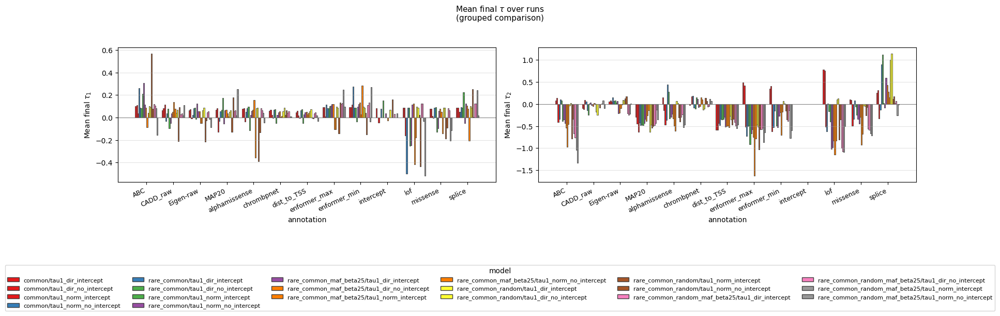

In [6]:
# Combined τ boxplots: auto-detect ablation-only vs τ-prior subfolder layout.
_layout = tau_experiment_layout(final_tau)
if _layout == "ablation_roots":
    _sub = add_model_variant_column(final_tau)
    _ann = tuple(sorted(_sub["annotation"].unique()))
    plot_tau_mean_grouped_bars(
        _sub,
        prior_subdir=None,
        annotations=_ann,
        # ablation_order=[BOX_PLOT_ABLATIONS],
        group_by="annotation",  # x = annotation, bars = full/T vs full/noT
    )
else:
    for _prior in TAU_PRIOR_SUBDIRS:
        _sub = slice_final_tau_by_prior(final_tau, _prior)
        if _sub.empty:
            print(
                f"No rows for prior {_prior!r} (re-run paths / final_tau after adding runs)."
            )
            continue
        _ann = tuple(sorted(_sub["annotation"].unique()))
        plot_tau_mean_grouped_bars(
            _sub,
            prior_subdir=_prior,
            annotations=_ann,
            # ablation_order=BOX_PLOT_ABLATIONS,
            group_by="annotation",  # x = annotation, bars = full/T vs full/noT
        )


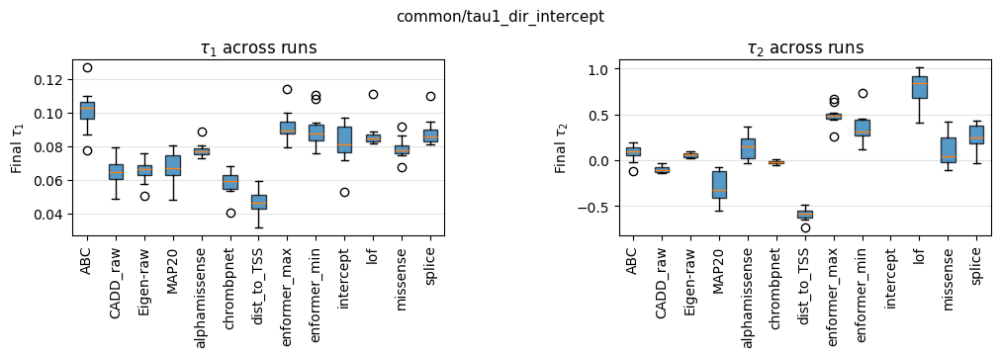

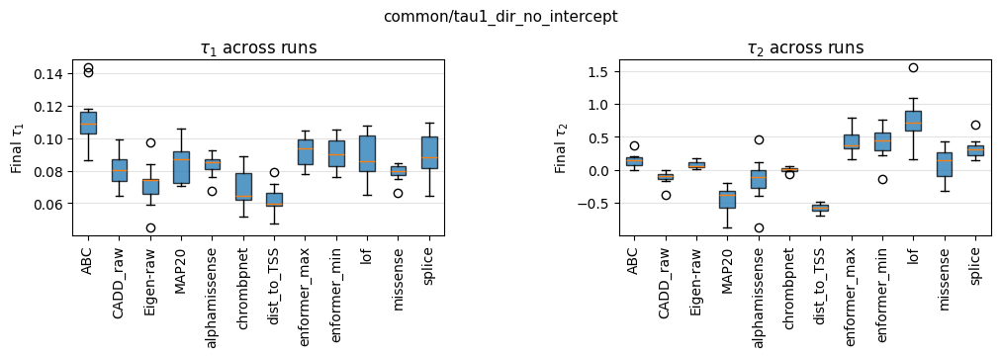

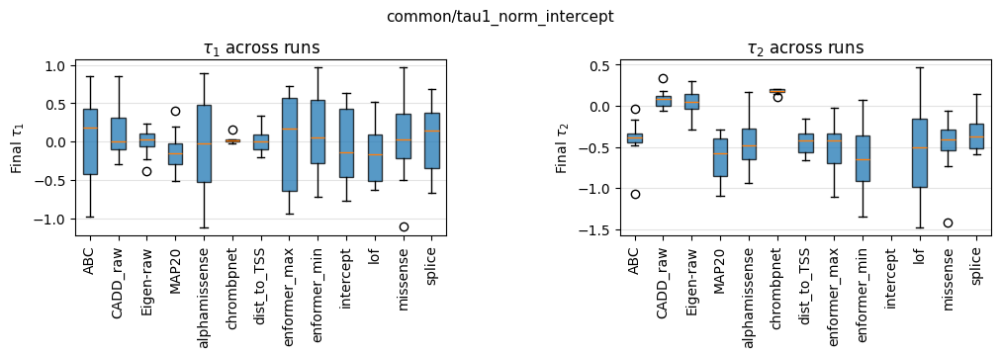

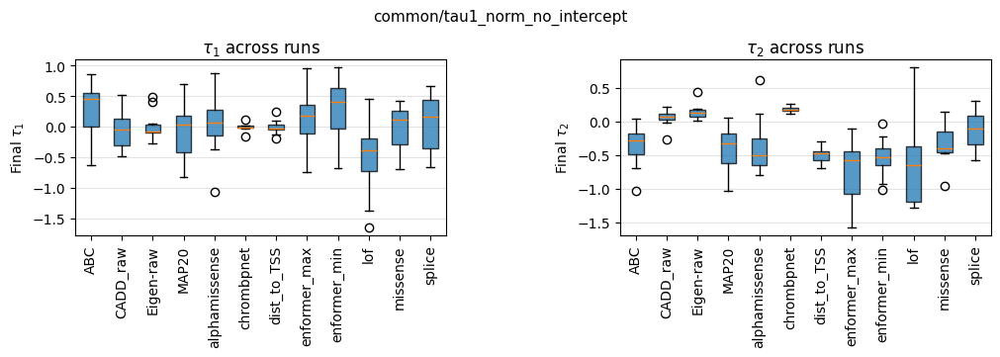

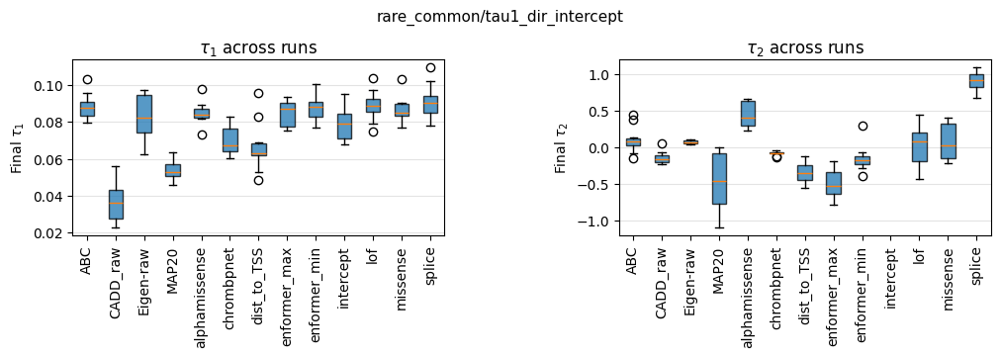

...

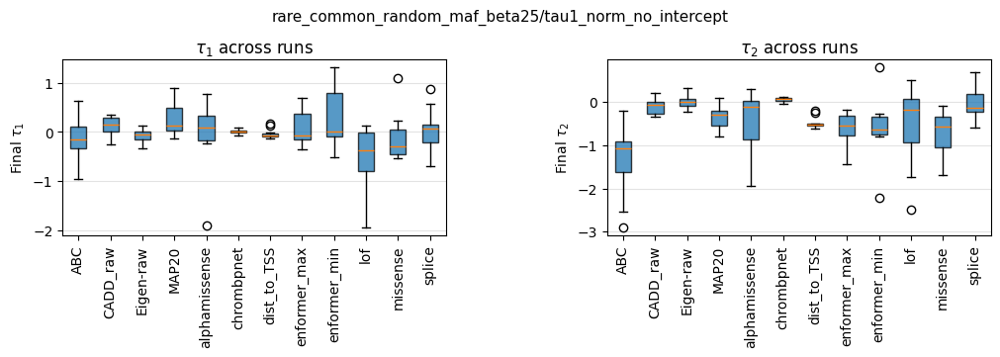

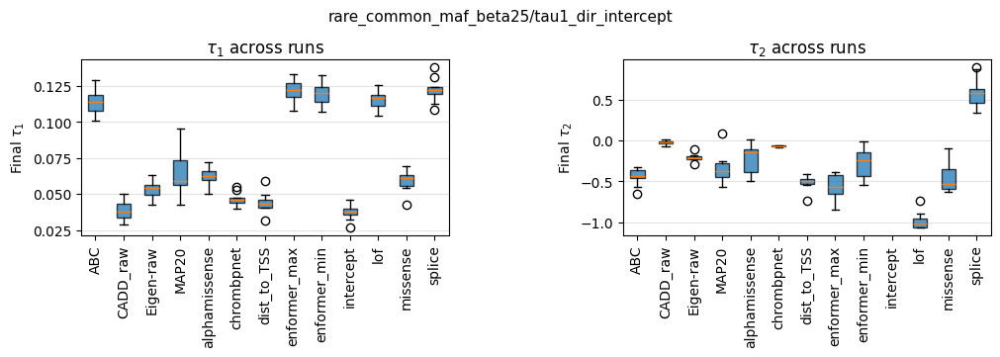

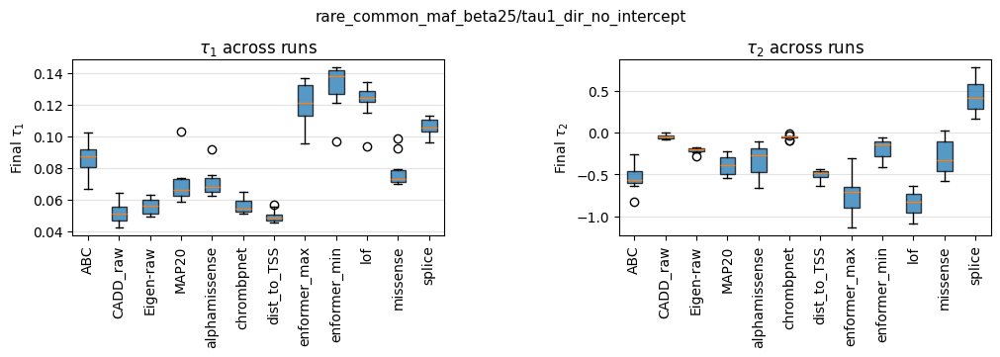

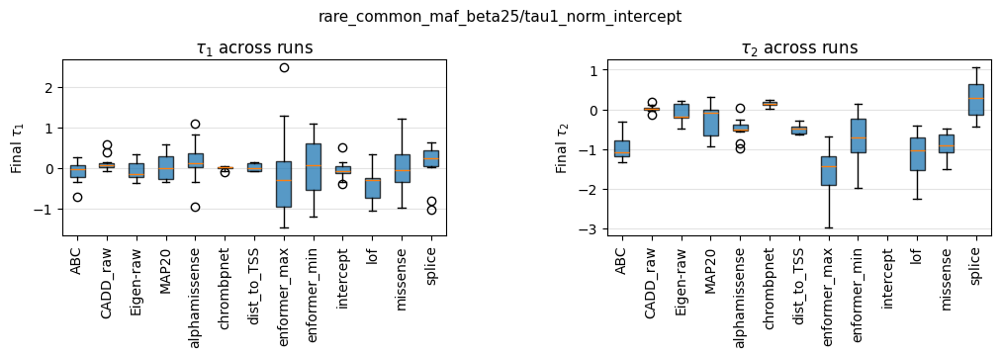

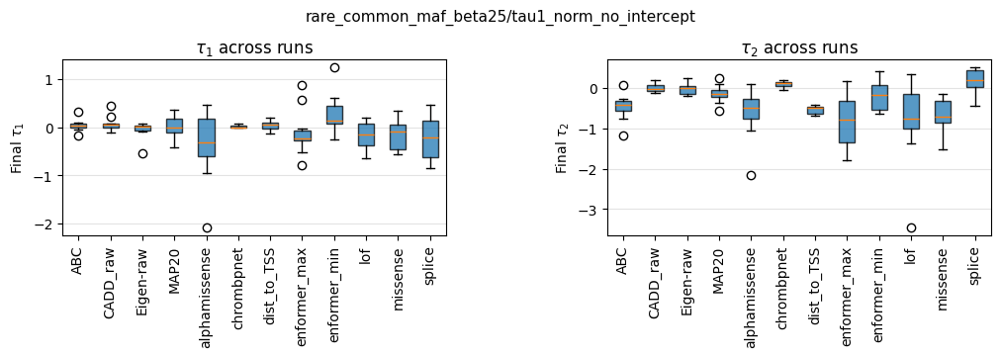

In [7]:
def plot_final_tau_boxplots(
    final_df: pd.DataFrame,
    figsize_per_row: float = 3.5,
    one_figure_per_config: bool = True,
):
    """Boxplots of final tau1 / tau2 per annotation across runs.

    If ``one_figure_per_config`` is True (default), each configuration is shown in its
    own figure so you can copy/paste without cropping. If False, all configs are stacked
    in one tall figure (previous behavior).
    """
    if final_df.empty:
        print("No final tau data; check CONFIG_ROOTS and tau_T.csv files.")
        return

    def _draw_config_in_gridspec(fig, inner, root):
        ax_row_title = fig.add_subplot(inner[0])
        ax_row_title.axis("off")
        ax_row_title.set_title(_short_config_label(root), fontsize=11, pad=2)
        bottom = inner[1].subgridspec(1, 2, wspace=0.22)
        ax1 = fig.add_subplot(bottom[0, 0])
        ax2 = fig.add_subplot(bottom[0, 1])
        sub = final_df[final_df["config_root"] == root]
        anns = sorted(sub["annotation"].unique())
        data1 = [sub.loc[sub["annotation"] == a, "tau1"].values for a in anns]
        data2 = [sub.loc[sub["annotation"] == a, "tau2"].values for a in anns]
        _bp_kw = {"tick_labels": anns, "patch_artist": True}
        try:
            bp1 = ax1.boxplot(data1, **_bp_kw)
            bp2 = ax2.boxplot(data2, **_bp_kw)
        except TypeError:
            _bp_kw = {"labels": anns, "patch_artist": True}
            bp1 = ax1.boxplot(data1, **_bp_kw)
            bp2 = ax2.boxplot(data2, **_bp_kw)
        for bp in (bp1, bp2):
            for p in bp["boxes"]:
                p.set_alpha(0.75)
        ax1.set_ylabel(r"Final $\tau_1$")
        ax2.set_ylabel(r"Final $\tau_2$")
        ax1.grid(axis="y", alpha=0.35)
        ax2.grid(axis="y", alpha=0.35)
        ax1.set_title(r"$\tau_1$ across runs", loc="center", pad=5)
        ax2.set_title(r"$\tau_2$ across runs", loc="center", pad=5)
        for ax in (ax1, ax2):
            ax.tick_params(axis="x", rotation=90)

    roots = final_df["config_root"].drop_duplicates().tolist()
    if one_figure_per_config:
        fig_h = max(2.8, figsize_per_row)
        for root in roots:
            fig = plt.figure(figsize=(10, fig_h), layout="constrained")
            inner = fig.add_gridspec(2, 1, height_ratios=[0.02, 1], hspace=0.02)
            _draw_config_in_gridspec(fig, inner, root)
            plt.show()
    else:
        n = len(roots)
        fig_h = max(2.5, n * figsize_per_row)
        fig = plt.figure(figsize=(10, fig_h), layout="constrained")
        outer = fig.add_gridspec(n, 1, hspace=0.3)
        for i, root in enumerate(roots):
            inner = outer[i].subgridspec(2, 1, height_ratios=[0.02, 1], hspace=0.02)
            _draw_config_in_gridspec(fig, inner, root)
        plt.show()


plot_final_tau_boxplots(final_tau)


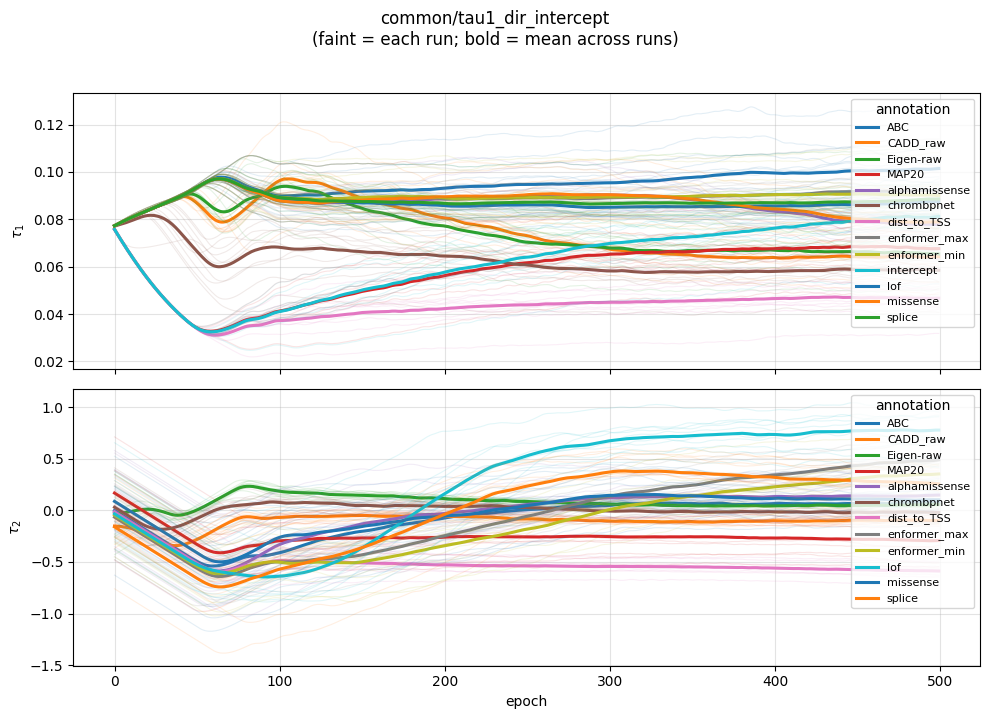

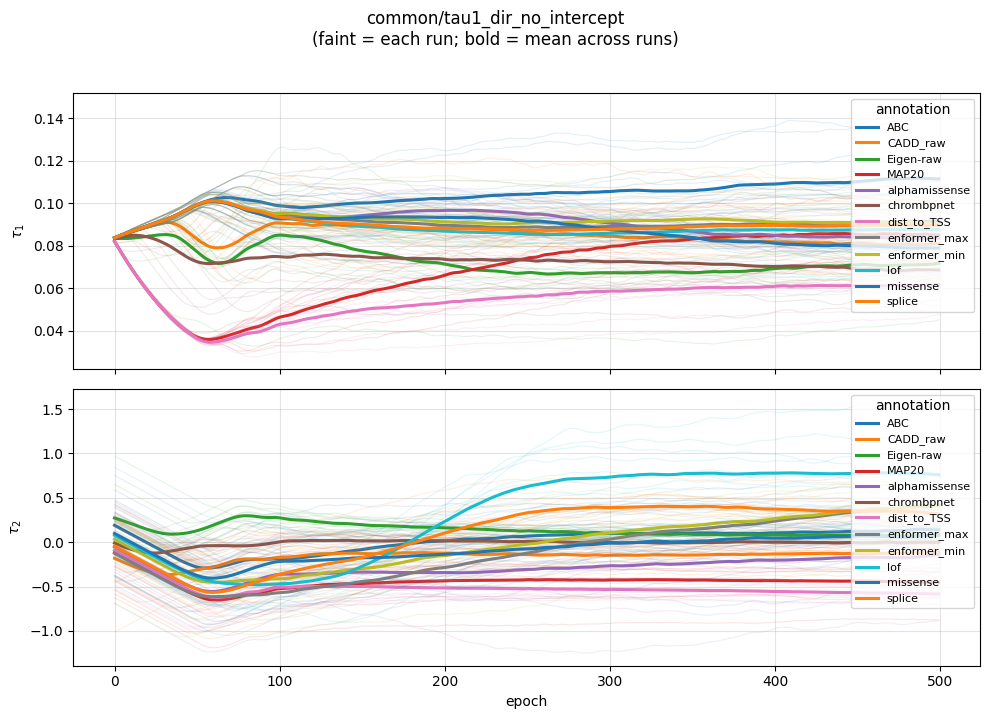

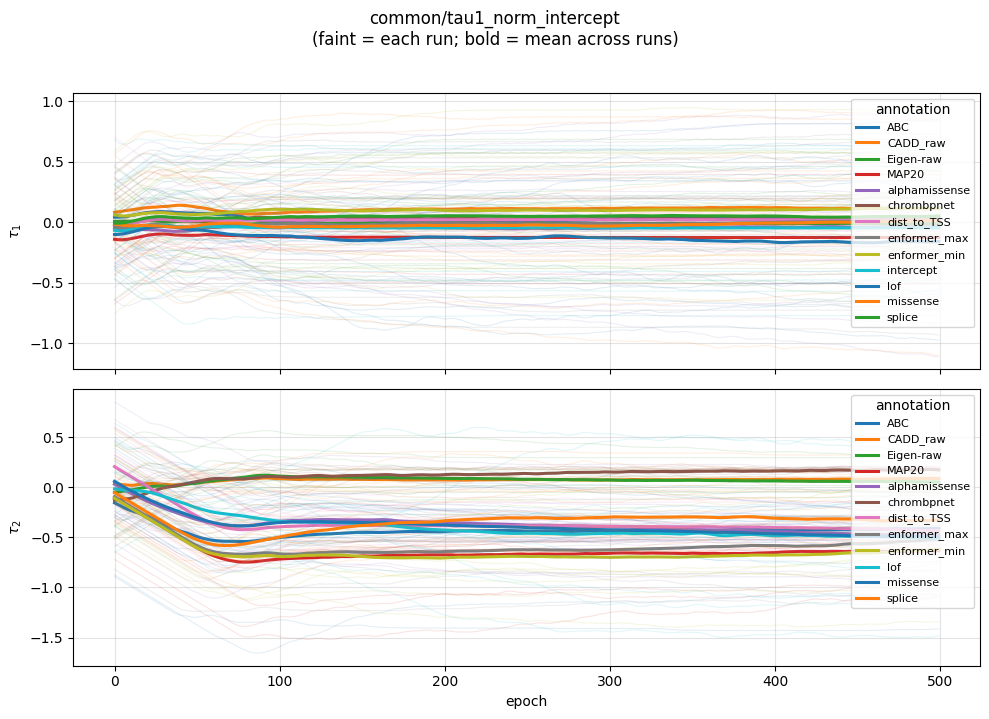

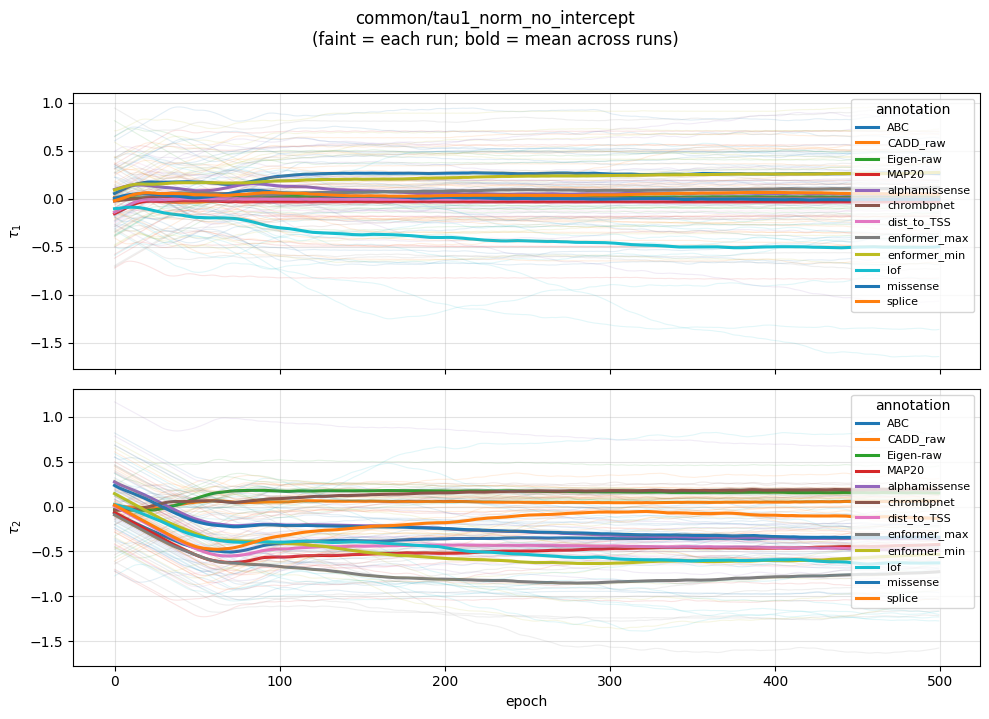

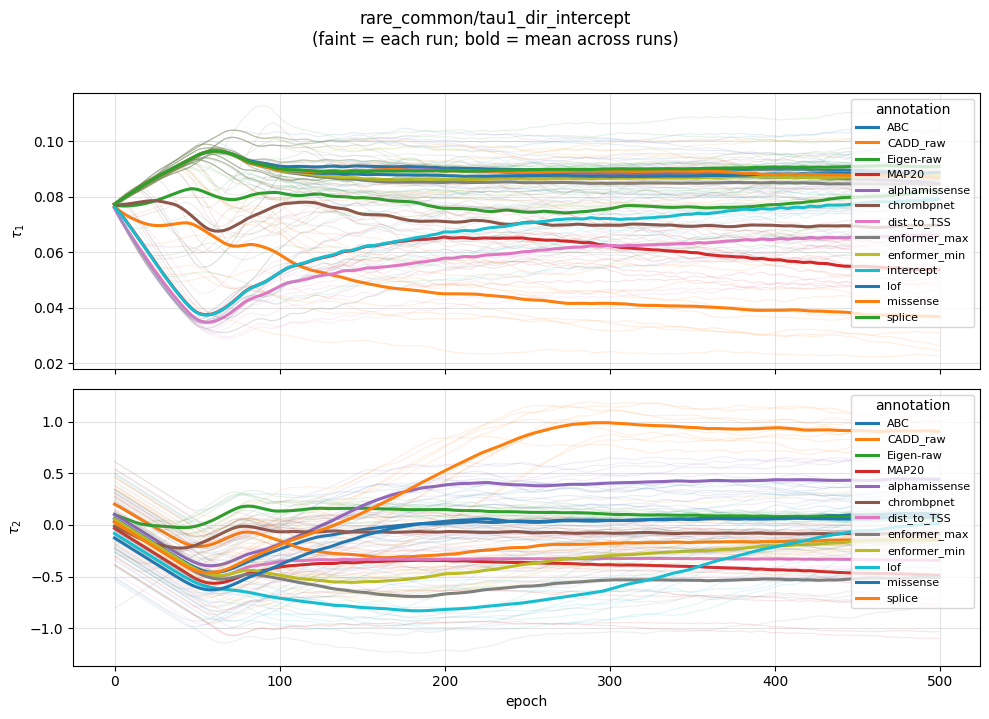

...

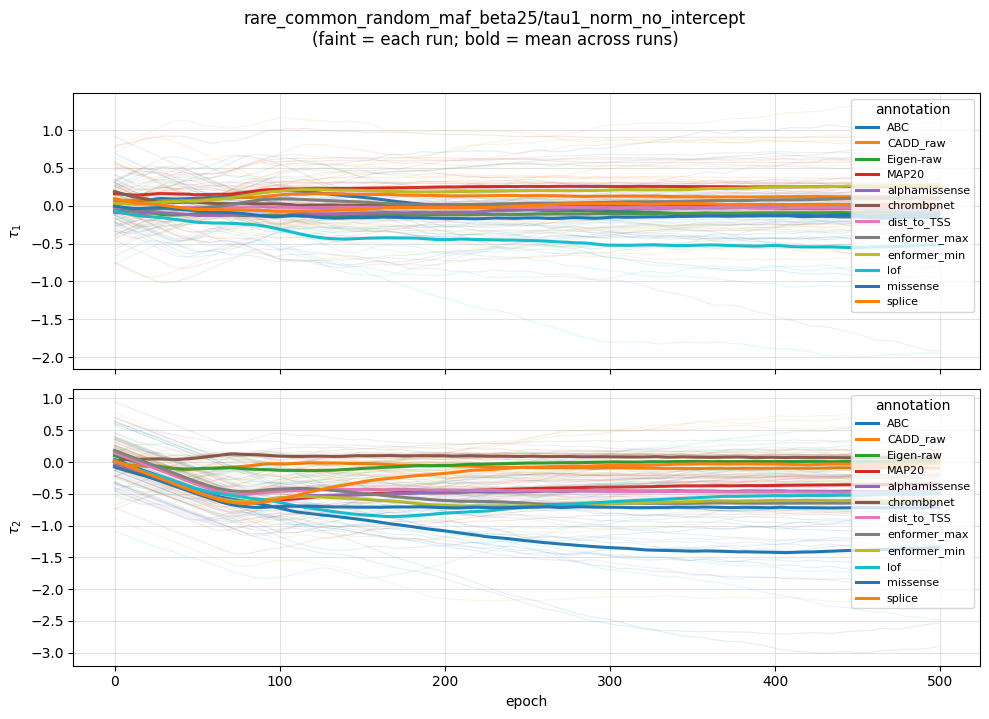

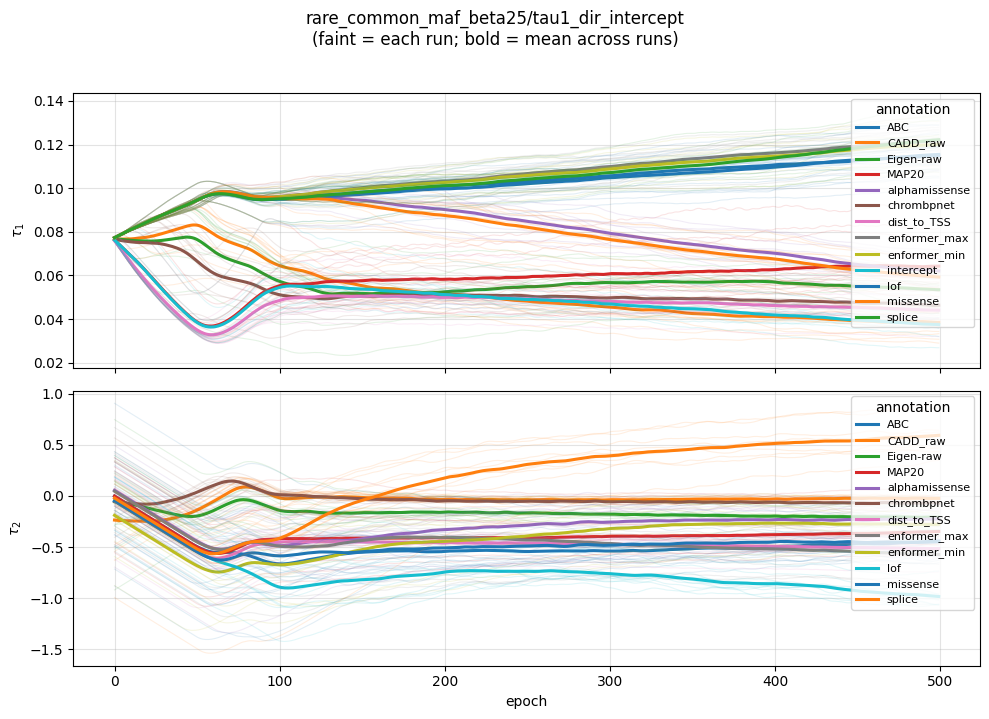

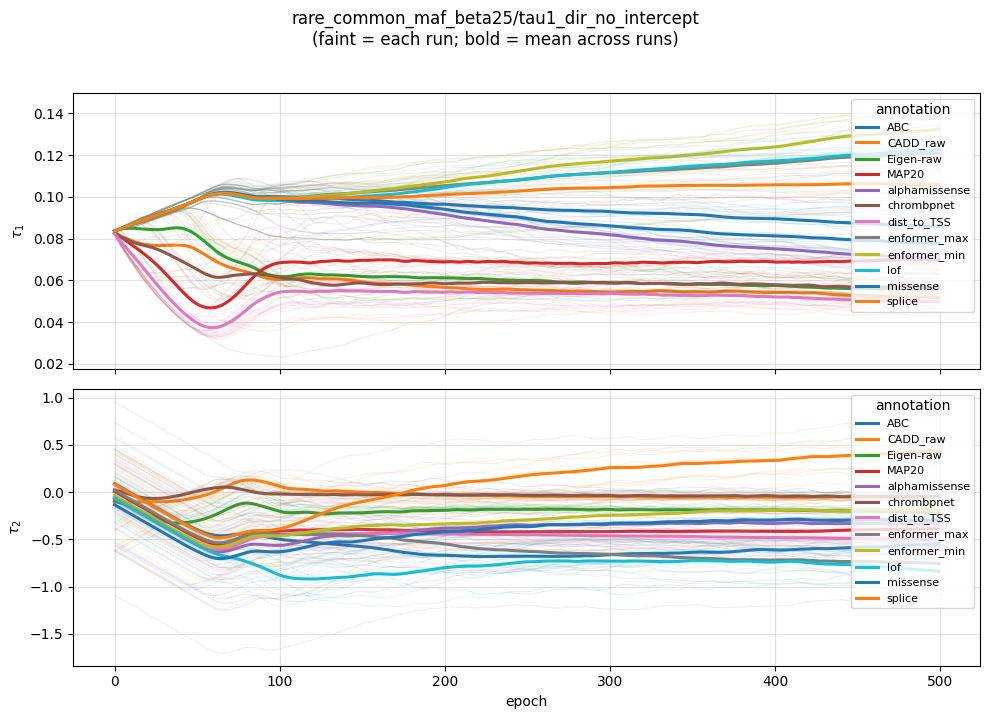

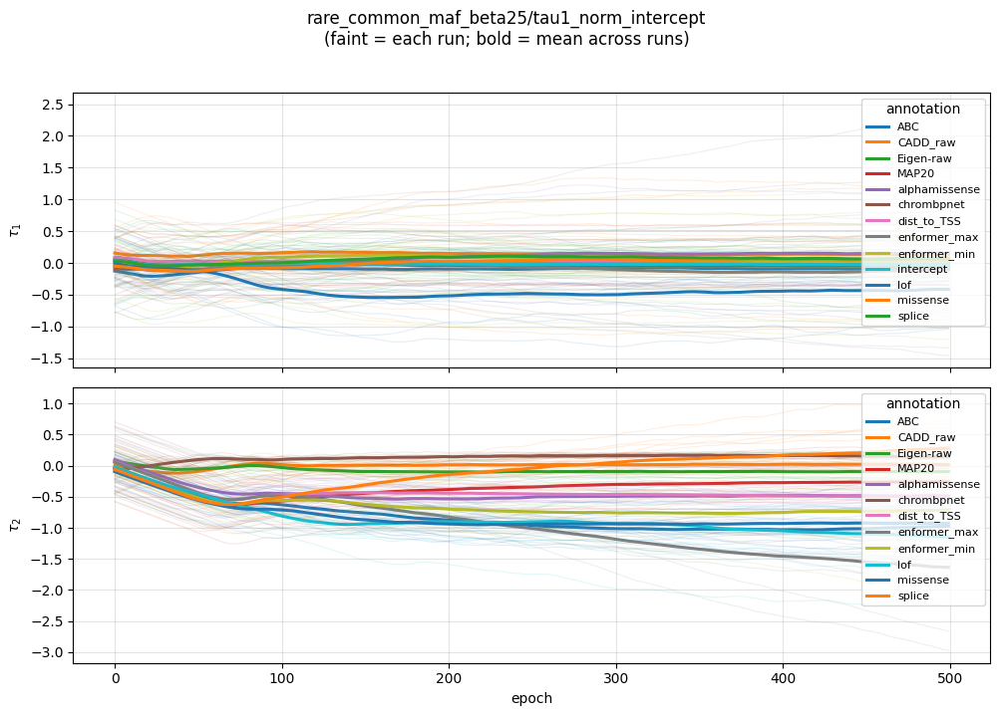

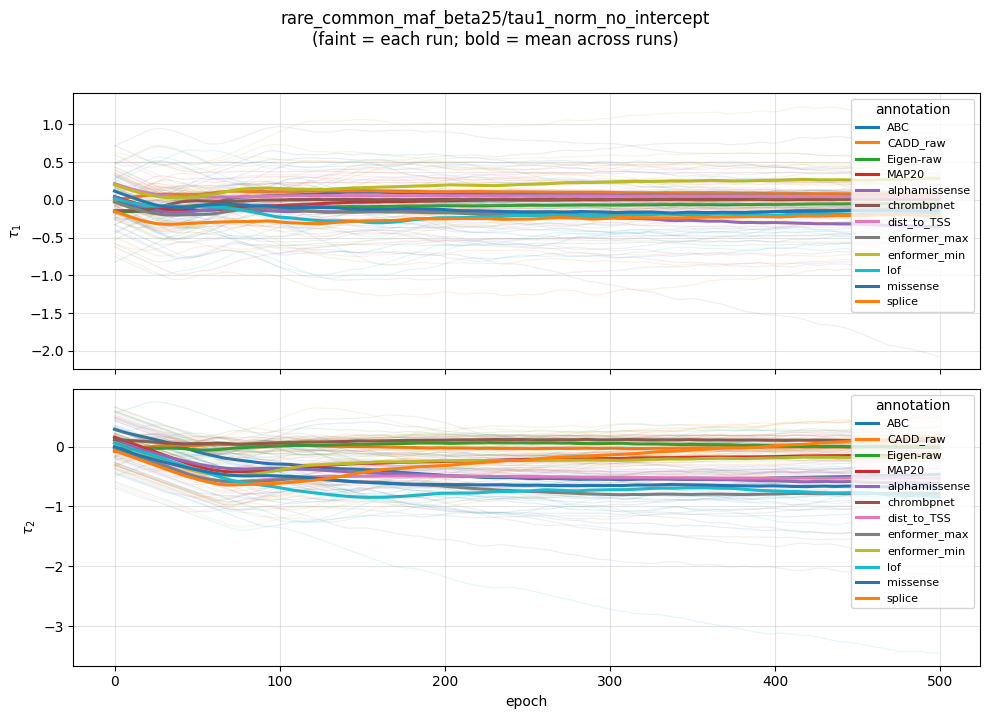

In [8]:
def plot_tau_history_trajectories(
    config_roots: list[str],
    fig_width: float = 10,
    run_line_alpha: float = 0.12,
):
    """For each config: tau1 and tau2 panels; faint per-run lines + mean across runs per annotation."""
    for root in config_roots:
        runs = list_run_dirs(root)
        if not runs:
            print(f"No runs under {root!r}")
            continue
        histories: list[pd.DataFrame] = []
        for rp in runs:
            h = load_tau_history(rp)
            if h is None or "epoch" not in h.columns:
                continue
            histories.append(h)
        if not histories:
            print(f"No tau_history.csv under runs in {root!r}")
            continue
        ref = histories[0]
        c1 = history_tau_columns(ref, "Tau1_")
        c2 = history_tau_columns(ref, "Tau2_")
        if not c1 or not c2:
            print(f"Missing Tau1_* / Tau2_* columns in {root!r}")
            continue
        fig, axes = plt.subplots(2, 1, figsize=(fig_width, 7), sharex=True)
        title = _short_config_label(root)
        cmap = plt.cm.tab10
        for row, cols, ylab in ((0, c1, r"$\tau_1$"), (1, c2, r"$\tau_2$")):
            ax = axes[row]
            for j, col in enumerate(cols):
                color = cmap(j % 10)
                ann = col.split("_", 1)[1] if "_" in col else col
                series_list = []
                for h in histories:
                    if col not in h.columns:
                        continue
                    y = pd.to_numeric(h[col], errors="coerce").values
                    x = pd.to_numeric(h["epoch"], errors="coerce").values
                    ax.plot(x, y, color=color, alpha=run_line_alpha, lw=0.8)
                    series_list.append(y)
                if series_list:
                    m = min(len(a) for a in series_list)
                    arr = np.array([a[:m] for a in series_list], dtype=float)
                    mean_y = np.nanmean(arr, axis=0)
                    x_mean = histories[0]["epoch"].values[:m]
                    ax.plot(
                        x_mean,
                        mean_y,
                        color=color,
                        lw=2.2,
                        label=ann,
                    )
            ax.set_ylabel(ylab)
            ax.grid(alpha=0.35)
            ax.legend(title="annotation", loc="upper right", fontsize=8)
        axes[-1].set_xlabel("epoch")
        fig.suptitle(f"{title}\n(faint = each run; bold = mean across runs)", y=1.02)
        plt.tight_layout()
        plt.show()


plot_tau_history_trajectories(CONFIG_DIRS)


100%|██████████| 500/500 [00:19<00:00, 26.06it/s]


Annotation-only matrix: 571773 variants × 58 features
Annotation matrix (only): 58 annotations per variant
Processing annotations...
Taking mean of chrombpnet annotations...
Z-scoring chrombpnet...
Clipping chrombpnet at 10, keeping sign...
Clipping dist_to_TSS at 0...
Processing annotation: chrombpnet
Processing annotation: dist_to_TSS
Processing annotation: ABC
Processing annotation: CADD_raw
Processing annotation: Eigen-raw
Processing annotation: enformer


/gpfs/commons/home/vmazeeva/firvTWAS/parmigiano-expr/src/load_data.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z['chrombpnet'] = (Z['chrombpnet'] - Z['chrombpnet'].mean()) / Z['chrombpnet'].std()
/gpfs/commons/home/vmazeeva/firvTWAS/parmigiano-expr/src/load_data.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z['chrombpnet'] = np.clip(Z['chrombpnet'], -10, 10)
/gpfs/commons/home/vmazeeva/firvTWAS/parmigiano-expr/src/load_data.py:96: SettingWithCopyWarning: 
A value is trying to be set on a cop

Processing annotation: lof
Processing annotation: missense
Processing annotation: splice
Processing annotation: MAP20
Processing annotation: alphamissense


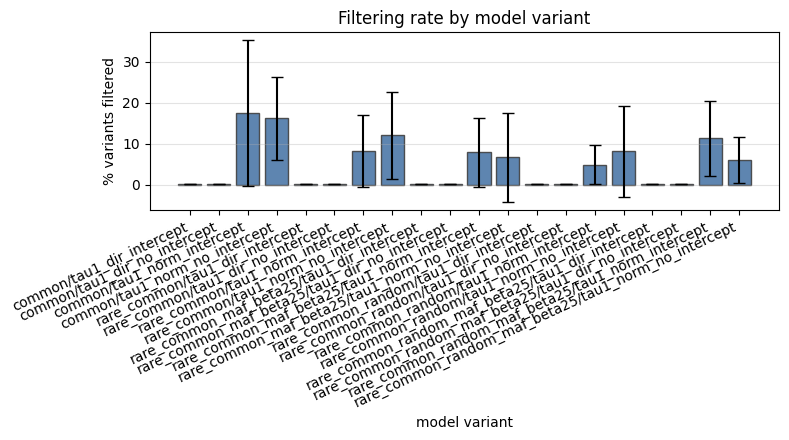

In [9]:
# Count filtered variants in T runs: variant filtered if abs(Ztau1) < T.
# Uses per-run tau_T.csv (Tau1 + Filter Threshold) and annotations loaded like load_data.py.

import yaml
import sys

if REPO_SRC not in sys.path:
    sys.path.append(REPO_SRC)

import load_data  # noqa: E402


def _read_run_tau_threshold(run_dir: str) -> tuple[list[str], np.ndarray, float]:
    """Return (annotation_names, tau1_values, threshold) from one run's tau_T.csv."""
    fp = os.path.join(run_dir, "tau_T.csv")
    if not os.path.isfile(fp):
        raise FileNotFoundError(f"Missing tau_T.csv: {fp}")
    tau_df = pd.read_csv(fp)

    ann_col = "Annotation" if "Annotation" in tau_df.columns else "annotation"
    tau1_col = "Tau1" if "Tau1" in tau_df.columns else "tau1"
    thr_col = "Filter Threshold" if "Filter Threshold" in tau_df.columns else "Filter_Threshold"

    if ann_col not in tau_df.columns or tau1_col not in tau_df.columns or thr_col not in tau_df.columns:
        raise ValueError(f"tau_T.csv missing required columns in {run_dir}")

    ann = tau_df[ann_col].astype(str).tolist()
    tau1 = tau_df[tau1_col].astype(float).to_numpy()
    thr = float(tau_df[thr_col].iloc[0])
    return ann, tau1, thr

def _select_annotation_design_matrix(Z: pd.DataFrame, ann: list[str], *, context: str = "") -> pd.DataFrame:
    """Return Z columns in ann order, injecting intercept column when needed."""
    missing = [a for a in ann if a != "intercept" and a not in Z.columns]
    if missing:
        where = f" for {context}" if context else ""
        raise ValueError(f"Missing annotations in Z{where}: {missing}")

    Z_use = Z
    if "intercept" in ann and "intercept" not in Z_use.columns:
        Z_use = Z_use.copy()
        Z_use["intercept"] = 1.0

    return Z_use[ann].astype(float)


def _load_processed_Z_from_run_config(run_dir: str) -> pd.DataFrame:
    """Load annotation matrix Z exactly using config + processing from load_data.py."""
    cfg_path = os.path.join(run_dir, "config.yaml")
    if not os.path.isfile(cfg_path):
        raise FileNotFoundError(f"Missing config.yaml: {cfg_path}")
    with open(cfg_path, "r") as f:
        cfg = yaml.safe_load(f)

    Z, _, _, _ = load_data.load_annotations_only(cfg, annotation_dir=cfg.get("annotation_dir"))

    logger = load_data.get_logger()
    if cfg.get("chrombpnet_dist_only", False):
        Z = load_data.process_chrombpnet_dist_only(Z, cfg, logger)
    if cfg.get("annotations", []):
        Z = load_data.process_annotations(Z, cfg, logger)

    if Z.isnull().any().any():
        Z = Z.fillna(0.0)

    return Z


def summarize_filtered_variants_for_t_configs(
    config_dirs: list[str],
    expected_runs: int | None = 10,
) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    For each config dir ending with '/T':
      - load processed Z once from run_1 config
      - for each run, compute Ztau1 = Z @ tau1
      - count variants where abs(Ztau1) < threshold T
    Returns per-run table and summary (mean/std across runs).
    """
    rows = []
    t_config_dirs = [d for d in config_dirs] #if str(d).rstrip("/").endswith("/T")

    for cfg_root in t_config_dirs:
        run_dirs = list_run_dirs(cfg_root)
        if expected_runs is not None:
            run_dirs = run_dirs[:expected_runs]
        if not run_dirs:
            print(f"No runs found under {cfg_root}")
            continue

        # Z is shared across runs of same config; load once using run_1 config.
        Z = _load_processed_Z_from_run_config(run_dirs[0])

        for run_dir in run_dirs:
            run_name = os.path.basename(run_dir)
            try:
                ann, tau1, thr = _read_run_tau_threshold(run_dir)

                Z_use = _select_annotation_design_matrix(Z, ann, context=run_name)
                ztau1 = Z_use.to_numpy() @ tau1
                n_total = int(ztau1.shape[0])
                n_filtered = int(np.sum(np.abs(ztau1) < thr))

                rows.append(
                    {
                        "config_root": cfg_root,
                        "config_label": _short_config_label(cfg_root),
                        "run": run_name,
                        "threshold": thr,
                        "n_variants": n_total,
                        "n_filtered": n_filtered,
                        "pct_filtered": 100.0 * n_filtered / max(n_total, 1),
                    }
                )
            except Exception as e:
                print(f"Skipping {run_dir}: {e}")

    per_run_df = pd.DataFrame(rows)
    if per_run_df.empty:
        return per_run_df, pd.DataFrame()

    summary_df = (
        per_run_df.groupby(["config_root", "config_label"], as_index=False)
        .agg(
            runs=("run", "count"),
            threshold_mean=("threshold", "mean"),
            threshold_std=("threshold", "std"),
            n_filtered_mean=("n_filtered", "mean"),
            n_filtered_std=("n_filtered", "std"),
            pct_filtered_mean=("pct_filtered", "mean"),
            pct_filtered_std=("pct_filtered", "std"),
            n_variants=("n_variants", "first"),
        )
        .sort_values(["config_label"])
        .reset_index(drop=True)
    )

    return per_run_df, summary_df


def plot_pct_filtered_summary(summary_df: pd.DataFrame, figsize=(8, 4.5)) -> None:
    """Bar plot of mean % filtered with run-to-run std error bars."""
    if summary_df.empty:
        print("No summary rows to plot.")
        return
    s = summary_df.copy().sort_values("config_label")
    x = np.arange(len(s))
    y = s["pct_filtered_mean"].to_numpy(dtype=float)
    yerr = s["pct_filtered_std"].fillna(0.0).to_numpy(dtype=float)

    plt.figure(figsize=figsize)
    plt.bar(x, y, yerr=yerr, capsize=4, color="#4C78A8", edgecolor="0.25", alpha=0.9)
    plt.xticks(x, s["config_label"], rotation=25, ha="right")
    plt.ylabel("% variants filtered")
    plt.xlabel("model variant")
    plt.title("Filtering rate by model variant")
    plt.grid(axis="y", alpha=0.35)
    plt.tight_layout()
    plt.show()


def _variant_filter_table_for_run(
    config_root: str,
    run_name: str = "run_1",
) -> pd.DataFrame:
    """Per-variant table for one run: Ztau1, threshold, and filtered flag."""
    run_dir = os.path.join(config_root, run_name)
    if not os.path.isdir(run_dir):
        raise FileNotFoundError(f"Run not found: {run_dir}")

    ann, tau1, thr = _read_run_tau_threshold(run_dir)
    Z = _load_processed_Z_from_run_config(run_dir)
    Z_use = _select_annotation_design_matrix(Z, ann, context=run_name)
    ztau1 = Z_use.to_numpy() @ tau1
    out = Z_use.copy()
    out["ztau1"] = ztau1
    out["threshold"] = thr
    out["filtered"] = np.abs(out["ztau1"]) < thr
    out["status"] = np.where(out["filtered"], "filtered", "kept")
    return out


def plot_annotation_value_by_filter_status(
    config_root: str,
    annotation: str,
    run_name: str = "run_1",
    figsize=(6.5, 4.5),
) -> None:
    """Side-by-side boxplots of one annotation value for filtered vs kept variants."""
    vt = _variant_filter_table_for_run(config_root, run_name=run_name)
    if annotation not in vt.columns:
        raise ValueError(f"Annotation {annotation!r} not in loaded Z columns.")

    filtered_vals = vt.loc[vt["filtered"], annotation].astype(float).to_numpy()
    kept_vals = vt.loc[~vt["filtered"], annotation].astype(float).to_numpy()

    plt.figure(figsize=figsize)
    bp = plt.boxplot(
        [filtered_vals, kept_vals],
        labels=[f"filtered (n={len(filtered_vals):,})", f"kept (n={len(kept_vals):,})"],
        patch_artist=True,
    )
    bp["boxes"][0].set_facecolor("#E45756")
    bp["boxes"][1].set_facecolor("#72B7B2")
    for b in bp["boxes"]:
        b.set_alpha(0.8)
    plt.ylabel(f"{annotation} value")
    plt.title(
        f"{annotation}: filtered vs kept\n{_short_config_label(config_root)} / {run_name}"
    )
    plt.grid(axis="y", alpha=0.35)
    plt.tight_layout()
    plt.show()


def _load_shared_processed_Z(config_dirs: list[str]) -> pd.DataFrame:
    """Load Z once from first available /T run config and reuse across model configs."""
    t_dirs = [d for d in config_dirs ] #if str(d).rstrip("/").endswith("/T")
    for cfg_root in t_dirs:
        run_dirs = list_run_dirs(cfg_root)
        if not run_dirs:
            continue
        cfg_path = os.path.join(run_dirs[0], "config.yaml")
        with open(cfg_path, "r") as f:
            cfg = yaml.safe_load(f)
        return _load_processed_Z_from_run_config(run_dirs[0])
    raise ValueError("No /T run directories found to load shared annotation matrix.")


def _mean_tau_threshold_for_config(
    config_root: str,
    expected_runs: int | None = 10,
) -> tuple[list[str], np.ndarray, float, int]:
    """Average tau1 vector and threshold across runs for one config."""
    run_dirs = list_run_dirs(config_root)
    if expected_runs is not None:
        run_dirs = run_dirs[:expected_runs]
    if not run_dirs:
        raise ValueError(f"No runs found under {config_root}")

    tau_rows = []
    thresholds = []
    ann_ref = None
    for run_dir in run_dirs:
        ann, tau1, thr = _read_run_tau_threshold(run_dir)
        tau_rows.append(pd.Series(tau1, index=ann, dtype=float))
        thresholds.append(float(thr))
        if ann_ref is None:
            ann_ref = list(ann)

    tau_df = pd.concat(tau_rows, axis=1).T
    ann_order = [a for a in ann_ref if a in tau_df.columns] + [a for a in tau_df.columns if a not in set(ann_ref)]
    tau_mean = tau_df[ann_order].mean(axis=0).to_numpy(dtype=float)
    thr_mean = float(np.mean(thresholds))
    return ann_order, tau_mean, thr_mean, len(run_dirs)


def summarize_filtered_variants_for_t_configs_shared_Z(
    config_dirs: list[str],
    shared_Z: pd.DataFrame,
    expected_runs: int | None = 10,
) -> tuple[pd.DataFrame, pd.DataFrame]:
    """Same summary as before, but reuse one preloaded shared Z matrix."""
    rows = []
    t_config_dirs = [d for d in config_dirs] #if str(d).rstrip("/").endswith("/T")

    for cfg_root in t_config_dirs:
        run_dirs = list_run_dirs(cfg_root)
        if expected_runs is not None:
            run_dirs = run_dirs[:expected_runs]
        for run_dir in run_dirs:
            run_name = os.path.basename(run_dir)
            try:
                ann, tau1, thr = _read_run_tau_threshold(run_dir)
                Z_use = _select_annotation_design_matrix(shared_Z, ann, context=run_name)
                ztau1 = Z_use.to_numpy() @ tau1
                n_total = int(ztau1.shape[0])
                n_filtered = int(np.sum(np.abs(ztau1) < thr))
                rows.append(
                    {
                        "config_root": cfg_root,
                        "config_label": _short_config_label(cfg_root),
                        "run": run_name,
                        "threshold": thr,
                        "n_variants": n_total,
                        "n_filtered": n_filtered,
                        "pct_filtered": 100.0 * n_filtered / max(n_total, 1),
                    }
                )
            except Exception as e:
                print(f"Skipping {run_dir}: {e}")

    per_run_df = pd.DataFrame(rows)
    if per_run_df.empty:
        return per_run_df, pd.DataFrame()

    summary_df = (
        per_run_df.groupby(["config_root", "config_label"], as_index=False)
        .agg(
            runs=("run", "count"),
            threshold_mean=("threshold", "mean"),
            threshold_std=("threshold", "std"),
            n_filtered_mean=("n_filtered", "mean"),
            n_filtered_std=("n_filtered", "std"),
            pct_filtered_mean=("pct_filtered", "mean"),
            pct_filtered_std=("pct_filtered", "std"),
            n_variants=("n_variants", "first"),
        )
        .sort_values(["config_label"])
        .reset_index(drop=True)
    )
    return per_run_df, summary_df


def _variant_filter_table_for_config_mean_threshold(
    config_root: str,
    shared_Z: pd.DataFrame,
    expected_runs: int | None = 10,
) -> pd.DataFrame:
    """Per-variant status using mean tau1 and mean threshold across runs."""
    ann, tau1_mean, thr_mean, n_runs = _mean_tau_threshold_for_config(config_root, expected_runs=expected_runs)
    Z_use = _select_annotation_design_matrix(shared_Z, ann, context="mean-threshold table")
    ztau1 = Z_use.to_numpy() @ tau1_mean
    out = Z_use.copy()
    out["ztau1_mean"] = ztau1
    out["threshold_mean"] = thr_mean
    out["filtered"] = np.abs(out["ztau1_mean"]) < thr_mean
    out["status"] = np.where(out["filtered"], "filtered", "kept")
    out["n_runs"] = n_runs
    return out


def plot_all_annotations_by_filter_status(
    config_root: str,
    shared_Z: pd.DataFrame,
    expected_runs: int | None = 10,
    annotations: list[str] | None = None,
    ncols: int = 4,
    figsize_per_panel=(3.1, 2.8),
) -> None:
    """Boxplots for all annotations: filtered vs kept, using mean threshold over runs."""
    vt = _variant_filter_table_for_config_mean_threshold(
        config_root,
        shared_Z=shared_Z,
        expected_runs=expected_runs,
    )

    ann_cols = [c for c in vt.columns if c in shared_Z.columns]
    if annotations is not None:
        ann_cols = [a for a in annotations if a in ann_cols]
    if not ann_cols:
        print("No annotation columns to plot.")
        return

    n = len(ann_cols)
    ncols = max(1, int(ncols))
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(figsize_per_panel[0] * ncols, figsize_per_panel[1] * nrows),
        squeeze=False,
    )

    binary_annotations = {"lof", "missense", "alphamissense"}

    for i, ann in enumerate(ann_cols):
        ax = axes[i // ncols][i % ncols]
        filtered_vals = vt.loc[vt["filtered"], ann].astype(float).to_numpy()
        kept_vals = vt.loc[~vt["filtered"], ann].astype(float).to_numpy()

        if ann in binary_annotations:
            # For binary annotations, show proportions for value=0 vs value=1 in each group.
            def _p(vals: np.ndarray, target: float) -> float:
                vals = vals[np.isfinite(vals)]
                if len(vals) == 0:
                    return np.nan
                return float(np.mean(np.isclose(vals, target)))

            p0 = [_p(filtered_vals, 0.0), _p(kept_vals, 0.0)]
            p1 = [_p(filtered_vals, 1.0), _p(kept_vals, 1.0)]
            x = np.arange(2, dtype=float)
            w = 0.34
            ax.bar(x - w / 2, p0, width=w, color="#9E9E9E", alpha=0.85, label="value=0")
            ax.bar(x + w / 2, p1, width=w, color="#4C78A8", alpha=0.85, label="value=1")
            ax.set_xticks(x)
            ax.set_xticklabels(["filtered", "kept"])
            ax.set_ylim(0, 1)
            ax.set_ylabel("proportion")
            ax.legend(fontsize=7, loc="upper right", frameon=True)
            ax.set_title(f"{ann} (binary)", fontsize=9)
            ax.grid(axis="y", alpha=0.3)
        else:
            bp = ax.boxplot(
                [filtered_vals, kept_vals],
                labels=["filtered", "kept"],
                patch_artist=True,
                widths=0.65,
                showfliers=True,
                whis=(5, 95),
                flierprops=dict(
                    marker="o",
                    markersize=2.2,
                    markerfacecolor="none",
                    markeredgecolor="#777777",
                    markeredgewidth=0.7,
                    alpha=0.35,
                ),
            )
            bp["boxes"][0].set_facecolor("#E45756")
            bp["boxes"][1].set_facecolor("#72B7B2")
            for b in bp["boxes"]:
                b.set_alpha(0.8)

            # Color outlier markers by group (filtered/kept) instead of default black.
            if "fliers" in bp and len(bp["fliers"]) >= 2:
                bp["fliers"][0].set_markeredgecolor("#E45756")
                bp["fliers"][0].set_alpha(0.4)
                bp["fliers"][1].set_markeredgecolor("#72B7B2")
                bp["fliers"][1].set_alpha(0.4)
            ax.set_title(ann, fontsize=9)
            ax.grid(axis="y", alpha=0.3)

    for j in range(n, nrows * ncols):
        axes[j // ncols][j % ncols].axis("off")

    n_f = int(vt["filtered"].sum())
    n_k = int((~vt["filtered"]).sum())
    fig.suptitle(
        f"Filtered vs kept annotation distributions\n{_short_config_label(config_root)} "
        f"(mean threshold and mean tau1 across {int(vt['n_runs'].iloc[0])} runs; filtered={n_f:,}, kept={n_k:,})",
        fontsize=11,
    )
    fig.tight_layout(rect=[0, 0.02, 1, 0.95])
    plt.show()


SHARED_Z = _load_shared_processed_Z(CONFIG_DIRS)

filtered_per_run_df, filtered_summary_df = summarize_filtered_variants_for_t_configs_shared_Z(
    CONFIG_DIRS,
    shared_Z=SHARED_Z,
    expected_runs=10,
)

filtered_summary_df
plot_pct_filtered_summary(filtered_summary_df)

# All annotations, not run-specific: uses mean tau1 + mean threshold across runs.
# plot_all_annotations_by_filter_status(
#     config_root=os.path.join(ROOT_DIR, "full", "T"),
#     shared_Z=SHARED_Z,
#     expected_runs=10,
# )


In [10]:
filtered_summary_df

,config_root,config_label,runs,threshold_mean,threshold_std,n_filtered_mean,n_filtered_std,pct_filtered_mean,pct_filtered_std,n_variants
0,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,common/tau1_dir_intercept,10,0.050000,2.252998e-08,710.6,347.077705,0.124280,0.060702,571773
1,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,common/tau1_dir_no_intercept,10,0.050000,3.048880e-08,1321.1,306.557390,0.231053,0.053615,571773
2,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,common/tau1_norm_intercept,10,0.050000,3.097113e-08,99864.2,101830.438298,17.465708,17.809592,571773
3,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,common/tau1_norm_no_intercept,10,0.050000,2.932595e-08,92942.5,57851.136167,16.255140,10.117850,571773
4,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,rare_common/tau1_dir_intercept,10,0.050000,3.751207e-08,421.0,83.827866,0.073631,0.014661,571773
5,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,rare_common/tau1_dir_no_intercept,10,0.050000,2.658404e-08,888.9,106.483645,0.155464,0.018623,571773
6,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,rare_common/tau1_norm_intercept,10,0.050000,3.284797e-08,47183.7,50148.197500,8.252174,8.770648,571773
7,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,rare_common/tau1_norm_no_intercept,10,0.050000,5.263881e-08,68865.2,60708.436488,12.044150,10.617577,571773
8,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,rare_common_maf_beta25/tau1_dir_intercept,10,0.050005,1.383428e-05,602.4,85.644225,0.105356,0.014979,571773
9,/gpfs/commons/home/vmazeeva/firvTWAS/parmigian...,rare_common_maf_beta25/tau1_dir_no_intercept,10,0.050000,3.366518e-08,981.1,124.098930,0.171589,0.021704,571773


<Axes: >

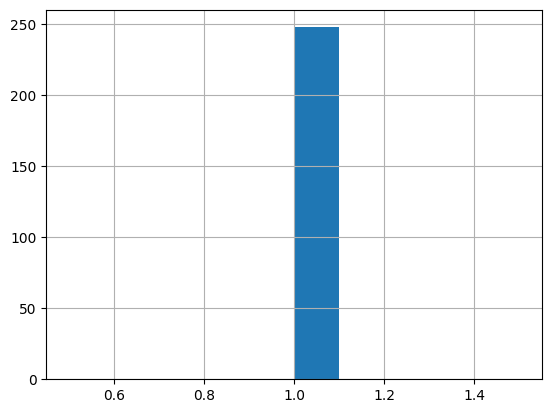

In [11]:
SHARED_Z['lof'].where(SHARED_Z['lof'] == 1).hist()

In [12]:
100/216146

0.00046265024566728046